# **Text to Image model**

In [1]:
#diffusers is a hugging face page for using diffusion models from hugginface hub
!pip install diffusers transformers accelerate

In [2]:
from diffusers import StableDiffusionPipeline
import torch
import matplotlib.pyplot as plt

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [3]:
!pip show torch

Name: torch
Version: 2.5.1+cu121
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3-Clause
Location: /usr/local/lib/python3.10/dist-packages
Requires: filelock, fsspec, jinja2, networkx, sympy, typing-extensions
Required-by: accelerate, fastai, peft, sentence-transformers, timm, torchaudio, torchvision


In [52]:
model_id1="dreamlike-art/dreamlike-diffusion-1.0"
model_id2="stabilityai/stable-diffusion-x1-base-1.0"
pipe=StableDiffusionPipeline.from_pretrained(model_id1,torch_dtype=torch.float16)
pipe=pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [5]:
prompt="""dreamlikeart, a grungy young woman with rainbow hair, travelling between dimensions, dynamic pose, happy, soft eyes and narrow chin, extreme bokeh, dainty figure, long hair straight down, torn kawali shirt and baggy jeans"""

In [7]:
#image1 generate using model_id1="dreamlike-art/dreamlike-diffusion-1.0"
image1=pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

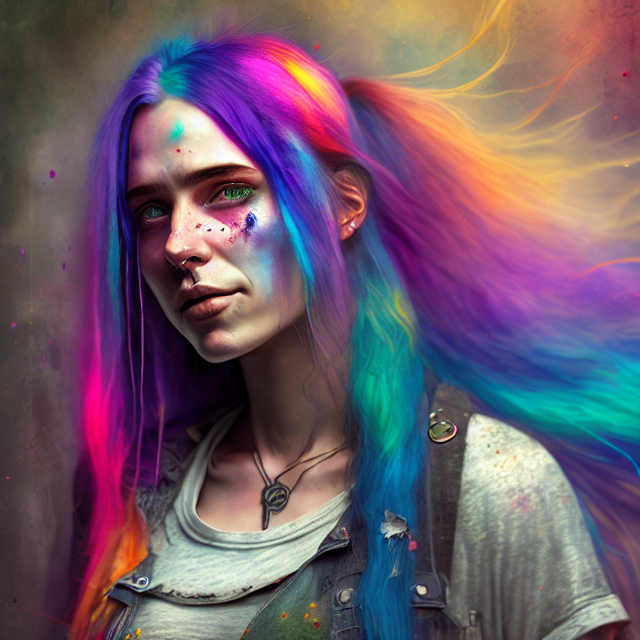

In [8]:
image1

[prompt]:  dreamlikeart, a grungy young woman with rainbow hair, travelling between dimensions, dynamic pose, happy, soft eyes and narrow chin, extreme bokeh, dainty figure, long hair straight down, torn kawali shirt and baggy jeans


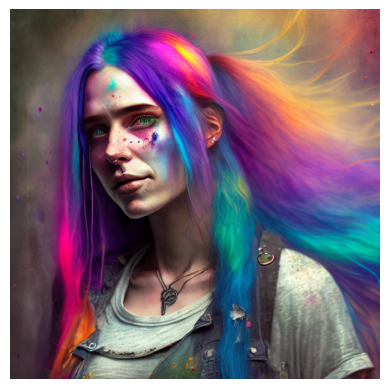

In [10]:
print("[prompt]: ", prompt)
plt.imshow(image1);
plt.axis("off");

##Working with Stable Diffusion Parameters


###Negative prompting

*   num_inference_steps
*   height
*   weight
*   num_images_per_prompt

In [11]:
def generate_image(pipe,prompt,params):
  img=pipe(prompt,**params).images

  num_images=len(img)
  if num_images>1:
    fig, ax=plt.subplots(nrows=1,ncols=num_images)
    for i in range(num_images):
      ax[i].imshow(img[i])
      ax[i].axis("off")
  else:
    fig=plt.figure()
    plt.imshow(img[0])
    plt.axis("off")
  plt.tight_layout()


In [22]:
promt="Realistic bustling medieval marketplace with merchants at wooden stalls, people in authentic attire, natural sunlight, cobblestone streets, rustic buildings, textured fabrics, wood, and stone. Includes diverse crowd, traders, townsfolk, and animals like horses and chickens."
params={}

  0%|          | 0/50 [00:00<?, ?it/s]

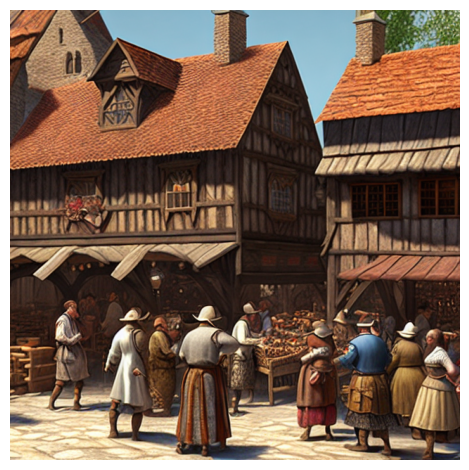

In [23]:
params={"num_inference_steps":50}
generate_image(pipe,promt,params)

  0%|          | 0/50 [00:00<?, ?it/s]

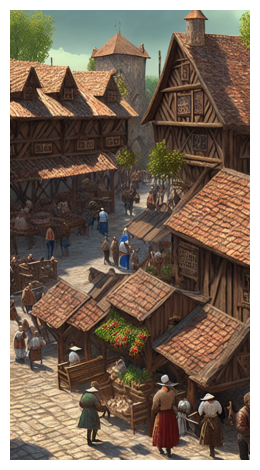

In [24]:
params={"num_inference_steps":50, 'width':512, 'height':int(1.5*640)}
generate_image(pipe,promt,params)

  0%|          | 0/50 [00:00<?, ?it/s]

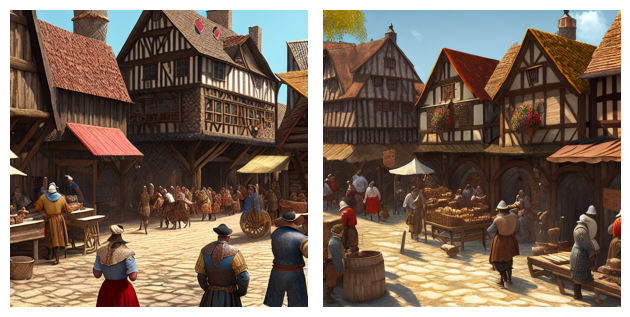

In [25]:
params={"num_inference_steps":50, 'num_images_per_prompt':2}
generate_image(pipe,promt,params)

  0%|          | 0/200 [00:00<?, ?it/s]

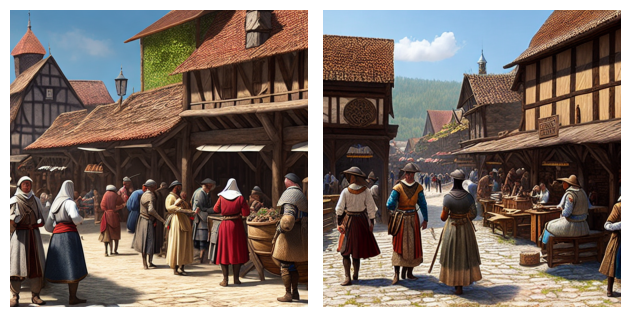

In [26]:
params={"num_inference_steps":200, 'num_images_per_prompt':2, 'negative_prompt':'ugly, distorted, low quality'}
generate_image(pipe,promt,params)

**Generate Another Image**

  0%|          | 0/50 [00:00<?, ?it/s]

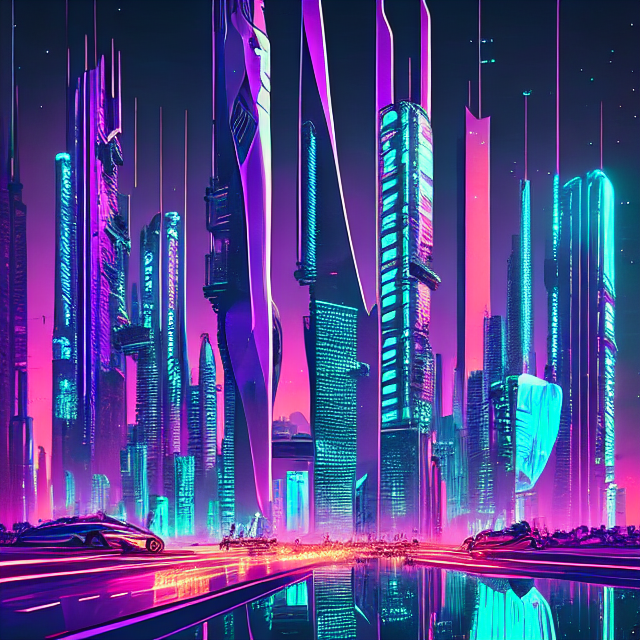

In [32]:
prompt="""Realistic futuristic cityscape with towering skyscrapers, flying cars, and vibrant neon lights glowing against the night sky. Streets buzz with activity, reflecting high-tech urban life."""

image2=pipe(prompt).images[0]
image2

  0%|          | 0/50 [00:00<?, ?it/s]

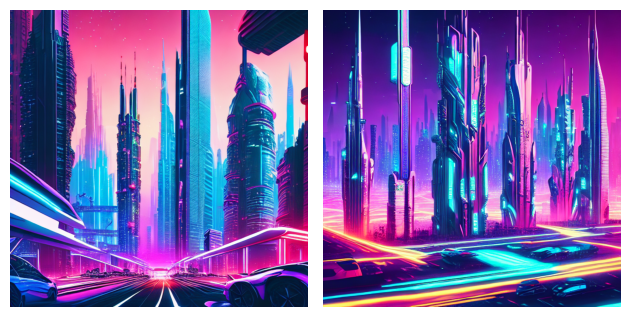

In [33]:
params={"num_inference_steps":50, 'num_images_per_prompt':2}
generate_image(pipe,prompt,params)

  0%|          | 0/50 [00:00<?, ?it/s]

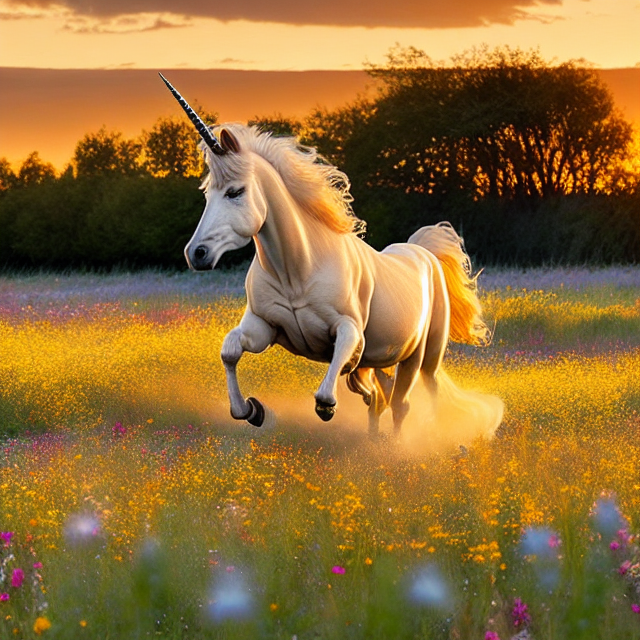

In [34]:
prompt="""A majestic unicorn with a proud posture and a fierce expression gallops majestically through a field of wildflowers, its coat reflecting the golden hue of the setting sun."""

image3=pipe(prompt).images[0]
image3

In [38]:
prompt3="""A girl is sitting on a chair & She is accompanied by her tiger. Make sure to keep it cinematic and color to be golden iris"""

  0%|          | 0/50 [00:00<?, ?it/s]

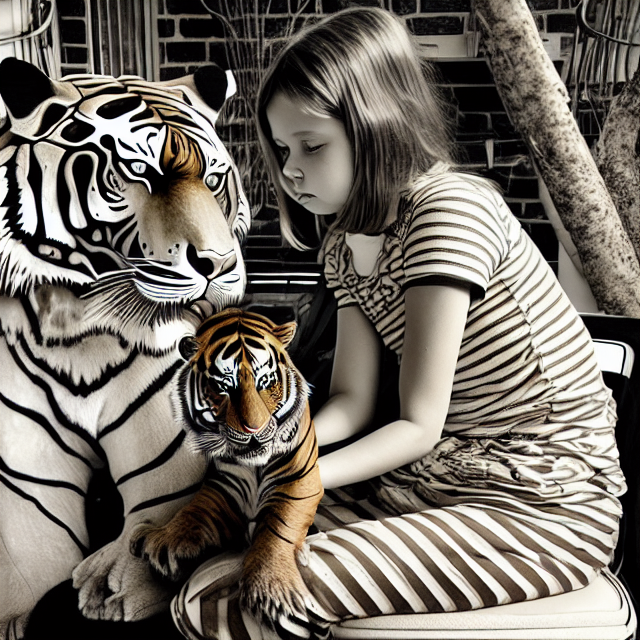

In [40]:
image4=pipe(prompt3).images[0]
image4

In [50]:
prompt5="A cinematic scene of a girl sitting elegantly with her majestic tiger. She has defined features, a detailed nose, exuding serenity. The tiger rests regally, its fur shimmering in warm golden light, showcasing their bond."

  0%|          | 0/50 [00:00<?, ?it/s]

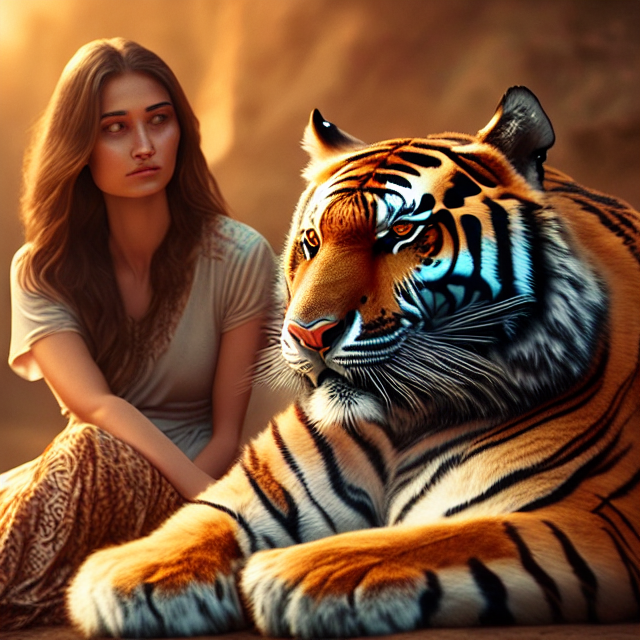

In [51]:
image5=pipe(prompt5).images[0]
image5

##Image Generate using model_id2="stabilityai/stable-diffusion-x1-base-1.0"

In [57]:
model_id2="stabilityai/stable-diffusion-x1-base-1.0"
pipe2=StableDiffusionPipeline.from_pretrained(model_id1,torch_dtype=torch.float16)
pipe2=pipe2.to("cuda")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

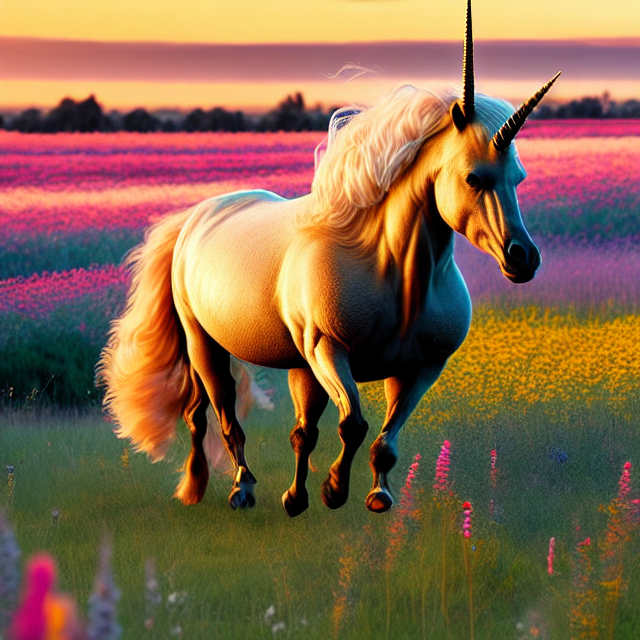

In [55]:
prompt6="""A majestic unicorn with a proud posture and a fierce expression gallops majestically through a field of wildflowers, its coat reflecting the golden hue of the setting sun."""

image6=pipe2(prompt6).images[0]
image6

  0%|          | 0/50 [00:00<?, ?it/s]

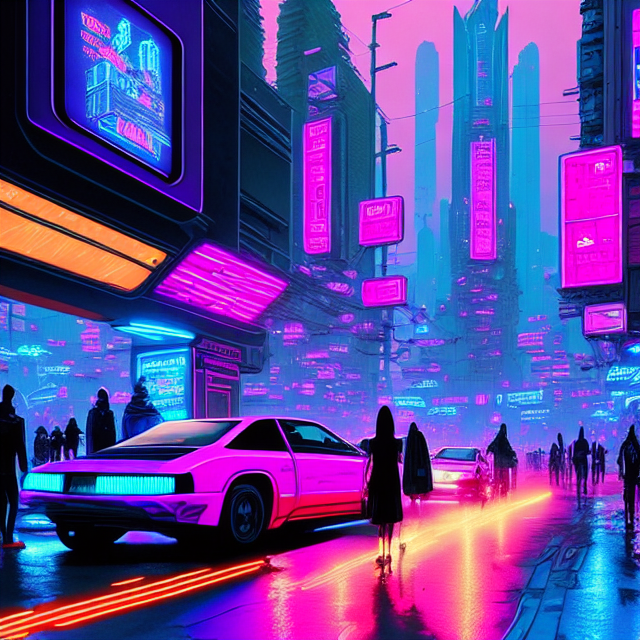

In [61]:
prompt6="""A bustling cyberpunk city at night with vibrant neon signs in blue, pink, and purple. Crowded streets feature futuristic vehicles and people in high-tech attire. Skyscrapers and rain-soaked roads reflect glowing lights."""

image6=pipe2(prompt6).images[0]
image6

##Image Generate using model_id3="stabilityai/stable-diffusion-2-1-base"

In [56]:
from diffusers import StableDiffusionPipeline
import torch
model_id3="stabilityai/stable-diffusion-2-1-base"
pipe3 = StableDiffusionPipeline.from_pretrained(model_id3, torch_dtype=torch.float16)
pipe3 = pipe3.to("cuda")

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
prompt7="""A cinematic scene of a girl sitting gracefully on a chair with her majestic tiger. The warm golden iris hue creates a magical atmosphere. The girl exudes serenity, and the tiger rests regally, its fur shimmering. Highlight their connection with intricate details for a captivating visual."""

  0%|          | 0/50 [00:00<?, ?it/s]

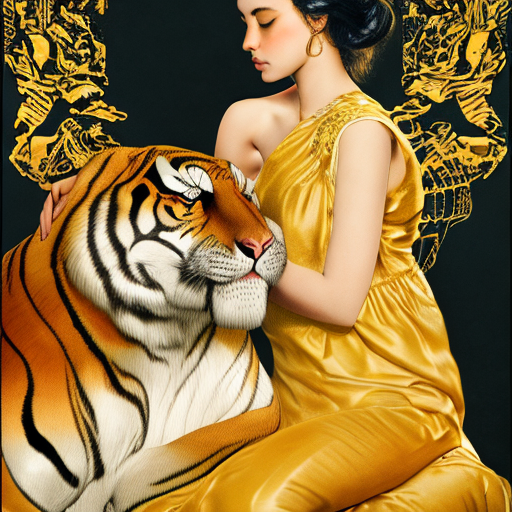

In [ ]:
image7=pipe3(prompt3).images[0]
image7

##Image Generate using model_id4="stabilityai/stable-diffusion-2-1"

In [58]:
model_id4="stabilityai/stable-diffusion-2-1"
pipe4 = StableDiffusionPipeline.from_pretrained(model_id4, torch_dtype=torch.float16)
pipe4 = pipe4.to("cuda")

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

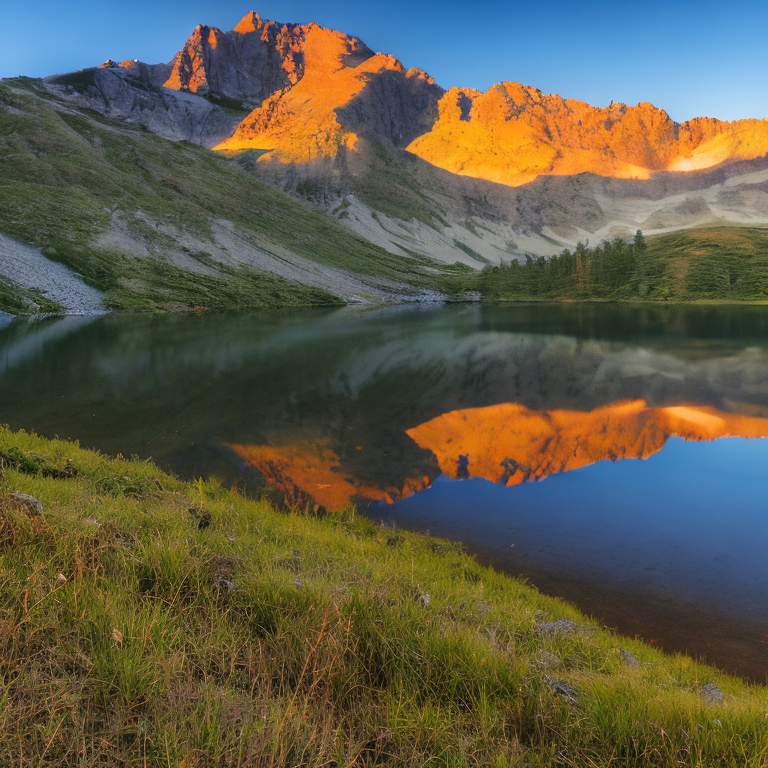

In [60]:
prompt8="""A serene mountain landscape at sunrise with lush green valleys, snow-capped peaks, and a clear lake reflecting vibrant sky colors. Warm sunlight casts soft shadows, enhancing textures and a tranquil atmosphere."""
image8=pipe4(prompt8).images[0]
image8

## **Some Prompt to Generate Image . **

A majestic unicorn with a proud posture and a fierce expression gallops majestically through a field of wildflowers, its coat reflecting the golden hue of the setting sun.
    A majestic unicorn with a long, flowing mane and gleaming silver horn galloping through a vibrant field of wildflowers, bathed in the warm glow of a setting sun.
    A majestic unicorn, its white coat shimmering in the soft light of a setting sun, gallops through a field of wildflowers in a serene forest clearing.
    A majestic unicorn galloping through a field of wildflowers, bathed in the warm glow of a setting sun."""

'''Science Fiction:

    A futuristic cityscape with towering skyscrapers and flying cars, illuminated by the neon lights of the night.
    A lone astronaut exploring the surface of a distant planet, with a breathtaking view of the cosmos in the background.
    A futuristic robot with glowing red eyes and a sleek, metallic body, standing amidst a field of rubble in a post-apocalyptic landscape.
    A futuristic spaceship soaring through the stars, with a breathtaking view of the Milky Way galaxy in the background.

Historical:

    A bustling medieval marketplace, with merchants selling their wares and people going about their daily lives.
    A grand castle perched atop a hill, with a sweeping view of the surrounding countryside.
    A group of soldiers marching through a snow-covered battlefield, with the smoke of battle rising in the distance.
    A bustling ancient city, with people going about their daily lives in the streets and markets.

Abstract:

    A swirling vortex of colors and shapes, evoking a sense of wonder and mystery.
    A serene landscape with rolling hills and a peaceful lake, bathed in the soft light of dawn.
    A chaotic scene with clashing colors and distorted shapes, evoking a sense of anxiety and unease.
    A minimalist composition with simple lines and shapes, evoking a sense of calm and tranquility.

Humorous:

    A cat wearing a tiny hat, sitting at a tea table with a cup of tea and a saucer.
    A dog chasing its own tail in circles, with a look of pure joy on its face.
    A group of animals having a tea party, with each animal dressed in their finest attire.
    A cat playing the piano, while a dog sings along.
